In [3]:
import geopandas
import matplotlib.pyplot as plt
import contextily as cx
import pandas
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')
geopandas.options.io_engine = "pyogrio"
%matplotlib inline

In [4]:
from config import PostgresReadOnlyConfig, PostgresReadWriteConfig
from sqlalchemy import create_engine

query = """
    select
             fid,
             geometry,
             soil_name, 
             soil_taxonomy, 
             soil_order,
             particle_size,
             hydrologic_group, 
             earth_cover, 
             runoff_class, 
             avg_slope_gradient,
             min_bedrock_depth,
             min_water_table_depth,
             potential_erosion_hazard, 
             erosion_class,
             earth_cover_kind_1,
             earth_cover_kind_2,
             geomorphic_description,
             aspect,
             drainage_class_dominant, 
             drainage_class_wettest, 
             annual_precipitation, 
             flood_prob_annual 
    FROM public.soils as s
     WHERE s.soil_name <> 'Water' and s.soil_name <> 'Alluvial land'
"""
conn_str = PostgresReadWriteConfig().__str__()
engine = create_engine(conn_str)
soils = geopandas.read_postgis(sql=query, con=engine, geom_col='geometry', crs="EPSG:26914")
soils

,fid,geometry,soil_name,soil_taxonomy,soil_order,particle_size,hydrologic_group,earth_cover,runoff_class,avg_slope_gradient,...,potential_erosion_hazard,erosion_class,earth_cover_kind_1,earth_cover_kind_2,geomorphic_description,aspect,drainage_class_dominant,drainage_class_wettest,annual_precipitation,flood_prob_annual
0,1,"MULTIPOLYGON (((585579.569 3369127.427, 585574...",Brackett,"Loamy, carbonatic, thermic, shallow Typic Hapl...",Inceptisols,loamy,D,Grass/herbaceous cover,High,17.500000,...,Severe,Class 1,Grass/herbaceous cover,Savanna rangeland,ridges on plateaus,170,Well drained,Well drained,0,None
1,2,"MULTIPOLYGON (((584624.758 3374124.418, 584793...",Heaton,"Loamy, siliceous, semiactive, thermic Arenic P...",Alfisols,loamy,B,Grass/herbaceous cover,Very low,3.000000,...,Slight,Class 1,Grass/herbaceous cover,Savanna rangeland,stream terraces on river valleys,170,Well drained,Well drained,0,None
2,3,"MULTIPOLYGON (((584793.826 3374487.018, 585011...",Eckrant,"Clayey-skeletal, smectitic, thermic Lithic Hap...",Mollisols,clayey-skeletal,D,Grass/herbaceous cover,Medium,4.300000,...,Slight,Class 1,Grass/herbaceous cover,Savanna rangeland,ridges on plateaus,130,Well drained,Well drained,0,None
3,4,"MULTIPOLYGON (((586576.736 3374321.548, 586576...",Heaton,"Loamy, siliceous, semiactive, thermic Arenic P...",Alfisols,loamy,B,Grass/herbaceous cover,Very low,3.000000,...,Slight,Class 1,Grass/herbaceous cover,Savanna rangeland,stream terraces on river valleys,170,Well drained,Well drained,0,None
4,5,"MULTIPOLYGON (((584439.235 3372851.219, 584425...",Eckrant,"Clayey-skeletal, smectitic, thermic Lithic Hap...",Mollisols,clayey-skeletal,D,Grass/herbaceous cover,High,19.799999,...,Moderate,Class 1,Grass/herbaceous cover,Savanna rangeland,ridges on plateaus,130,Well drained,Well drained,0,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7493,7595,"MULTIPOLYGON (((628338.081 3325948.127, 628334...",Heiden,"Fine, smectitic, thermic Udic Haplusterts",Vertisols,fine,D,Grass/herbaceous cover,Very high,7.100000,...,Moderate,Class 2,Grass/herbaceous cover,Shrubby rangeland,linear gilgai on ridges on plains,135,Well drained,Well drained,0,None
7494,7596,"MULTIPOLYGON (((627436.151 3325017.550, 627424...",Wilson,"Fine, smectitic, thermic Oxyaquic Vertic Haplu...",Alfisols,fine,D,Shrub cover,Very high,3.000000,...,Slight,Class 1,Shrub cover,,"stream terraces on plains, river valleys",135,Moderately well drained,Moderately well drained,0,None
7495,7597,"MULTIPOLYGON (((629777.313 3327437.424, 629781...",Wilson,"Fine, smectitic, thermic Oxyaquic Vertic Haplu...",Alfisols,fine,D,Shrub cover,Very high,3.000000,...,Slight,Class 1,Shrub cover,,"stream terraces on plains, river valleys",135,Moderately well drained,Moderately well drained,0,None
7496,7598,"MULTIPOLYGON (((627060.766 3324630.728, 627041...",Houston Black,"Fine, smectitic, thermic Udic Haplusterts",Vertisols,fine,D,Crop cover,Very high,2.200000,...,Slight,Class 1,Crop cover,Row crop,linear gilgai on ridges on plains,135,Moderately well drained,Moderately well drained,0,None


In [5]:
query = """
select * from public.watershed w
"""
watershed = geopandas.read_postgis(sql=query, con=engine, geom_col='geometry', crs="EPSG:26914")

In [6]:
query = """
select * from public.hydrography
"""
hydrography = geopandas.read_postgis(sql=query, con=engine, geom_col='geometry', crs="EPSG:26914")

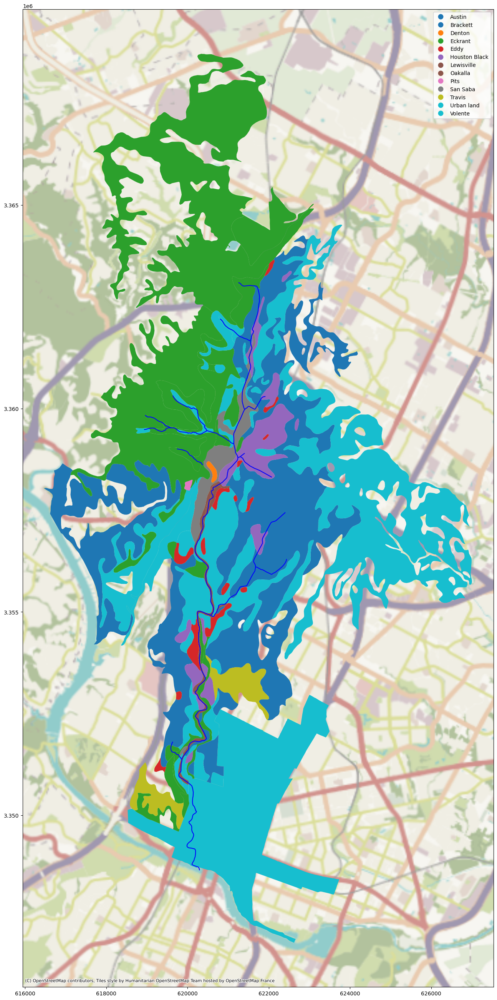

In [7]:
soil_names = soils[soils.intersects(watershed.geometry[0])]  

fig, ax = plt.subplots(figsize=(33, 33))
soil_names.plot(column='soil_name', ax=ax, legend=True)
hydrography.plot(color='blue', ax=ax)
cx.add_basemap(ax, crs=hydrography.crs)

['Very low', 'Low', 'Negligible', 'Medium', 'High', 'Very high']
[0, 1, 2, 3, 4, 5]


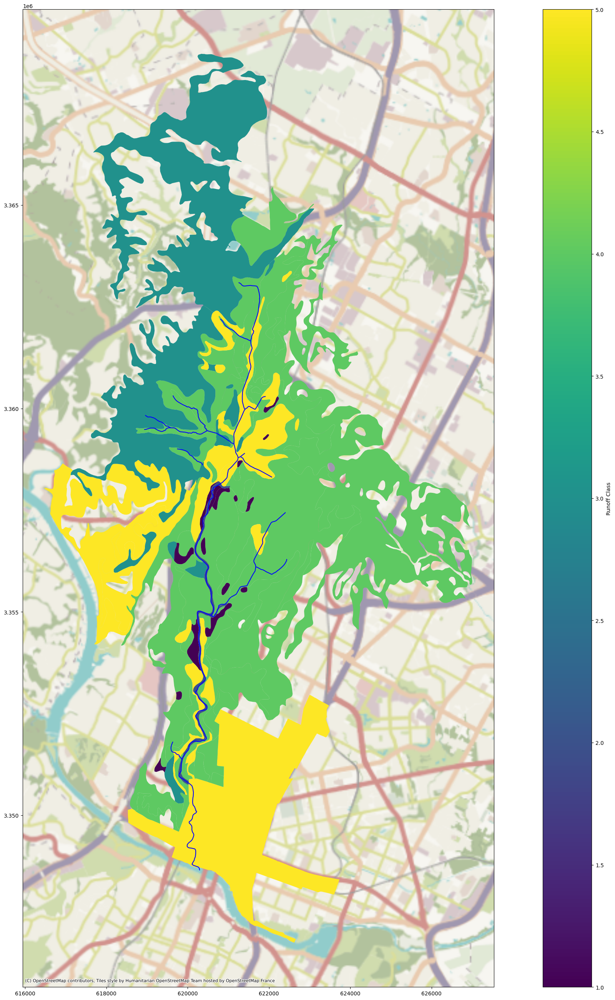

In [8]:
soils_by_runoff = soils[soils["runoff_class"] != " "].loc[soils.intersects(watershed.geometry[0])]

labels = pandas.DataFrame(data=['Very low', 'Low', 'Negligible', 'Medium', 'High', 'Very high'], columns=['x'])

le = LabelEncoder()
le.classes_ = labels['x']

soils_by_runoff['runoff_class_label'] = le.transform(soils_by_runoff['runoff_class'])
legend_labels = dict(zip(le.classes_, range(len(le.classes_))))

print(list(legend_labels.keys()))
print(list(legend_labels.values()))

fig, ax = plt.subplots(figsize=(33, 33))
soils_by_runoff.plot(column='runoff_class_label',
                     ax=ax,
                     legend=True,
                     legend_kwds={'label': 'Runoff Class'})
hydrography.plot(color='blue', ax=ax)
cx.add_basemap(ax, crs=hydrography.crs)

['Not rated', 'Slight', 'Moderate', 'Severe']
[0, 1, 2, 3]


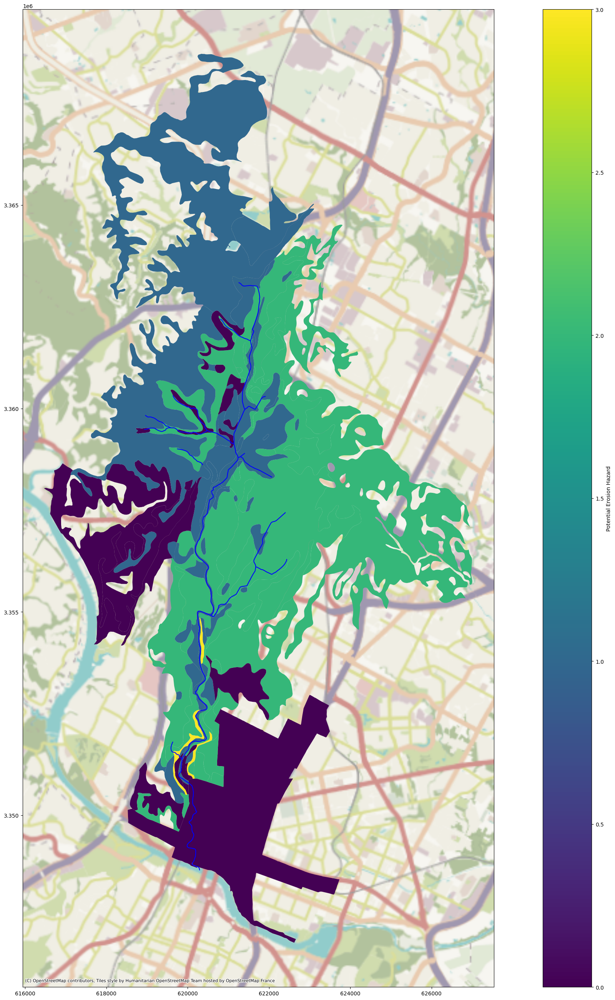

In [9]:
%matplotlib inline

soils_by_runoff = soils[soils["potential_erosion_hazard"] != " "].loc[soils.intersects(watershed.geometry[0])]

labels = pandas.DataFrame(data=['Not rated', 'Slight', 'Moderate', 'Severe'], columns=['x'])

le = LabelEncoder()
le.classes_ = labels['x']

soils_by_runoff['potential_erosion_hazard_label'] = le.transform(soils_by_runoff['potential_erosion_hazard'])
legend_labels = dict(zip(le.classes_, range(len(le.classes_))))

print(list(legend_labels.keys()))
print(list(legend_labels.values()))
fig, ax = plt.subplots(figsize=(33, 33))
soils_by_runoff.plot(column='potential_erosion_hazard_label',
                     ax=ax,
                     legend=True,
                     legend_kwds={'label': 'Potential Erosion Hazard'})
hydrography.plot(color='blue', ax=ax)
cx.add_basemap(ax, crs=hydrography.crs)

['None', 'Rare', 'Occasional', 'Frequent']
[0, 1, 2, 3]


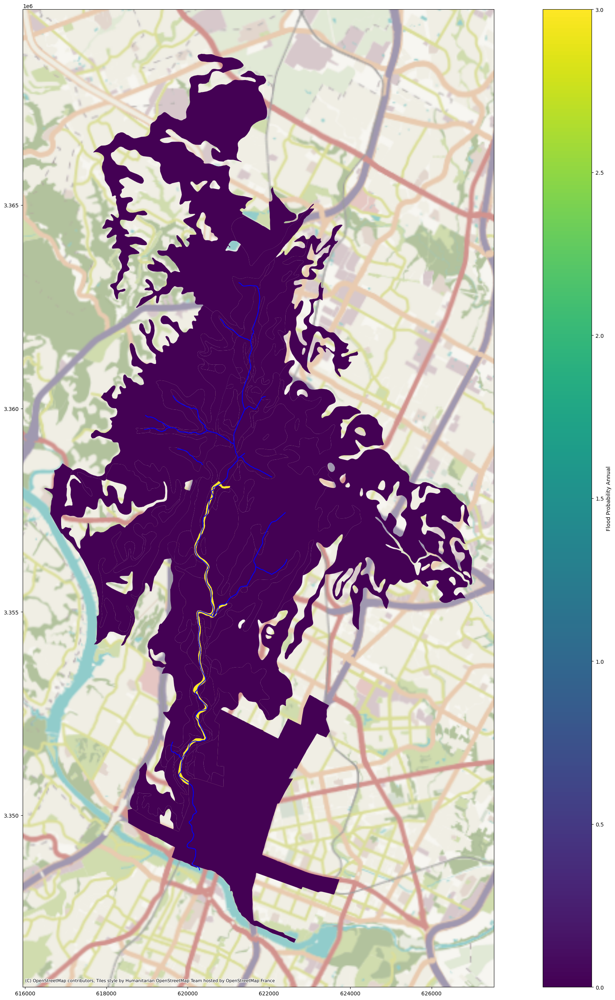

In [10]:
%matplotlib inline

soils_by_runoff = soils[soils["flood_prob_annual"] != " "].loc[soils.intersects(watershed.geometry[0])]

labels = pandas.DataFrame(data=['None', 'Rare', 'Occasional', 'Frequent'], columns=['x'])

le = LabelEncoder()
le.classes_ = labels['x']

soils_by_runoff['flood_prob_annual_label'] = le.transform(soils_by_runoff['flood_prob_annual'])
legend_labels = dict(zip(le.classes_, range(len(le.classes_))))

print(list(legend_labels.keys()))
print(list(legend_labels.values()))
fig, ax = plt.subplots(figsize=(33, 33))
soils_by_runoff.plot(column='flood_prob_annual_label',
                     ax=ax,
                     legend=True,
                     legend_kwds={'label': 'Flood Probability Annual'})
hydrography.plot(color='blue', ax=ax)
cx.add_basemap(ax, crs=hydrography.crs)